In [1]:
import numpy as np
import cv2
import glob
import math
import matplotlib.pyplot as plt
from PIL import Image
from os.path import join
import time

In [2]:
def gaussian(h, w, sigma):
    gaussian_filter = np.zeros((h, w))
    for i in range(h):
        for j in range(w):
            gaussian_filter[i, j] = \
            math.exp(-((i-(h-1)/2)**2 + (j-(w-1)/2)**2) / (2 * sigma**2)) / (2 * np.pi * sigma**2)
    return gaussian_filter
def norm(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

In [3]:
def subsample(img):
    img_freq = np.fft.fft2(img)
    #plt.subplot(1, 3, 1)
    #plt.imshow(np.log(np.abs(np.fft.fftshift(img_freq))))
    '''
    kernel = gaussian(img.shape[0], img.shape[1], img.shape[0]/4)
    kernel = kernel/ np.max(kernel)/2
    kernel = np.fft.fftshift(kernel)
    '''
    kernelFFT = np.zeros_like(img)
    kernel = gaussian(5,5,1)
    kernelFFT[0:5,0:5] = kernel
    kernelFFT = np.fft.fft2(kernelFFT)
    
    #print(img.shape[0])
    #341 -> 40
    #3212
    #print(np.min(kernel))
    #print(np.max(kernel))
    #plt.subplot(1, 3, 2)
    #plt.imshow(np.log(np.abs(kernelFFT)))
    convolved = img_freq*kernelFFT
    G_img = np.abs(np.fft.ifft2(convolved))
    #G_img = norm(G_img)
    
    #plt.subplot(1, 3, 3)
    #plt.imshow(np.log(np.abs(np.fft.fftshift(convolved))))
    #plt.show()
    
    # sub sampling
    sub_img = G_img[::2, ::2]
    return sub_img

In [4]:
#Sum of square difference
def SSD(A, B):
    return np.sum((A - B)**2)
#Normalized Cross Correlation
def NCC(A, B):
    top = np.sum((A - np.mean(A))*(B - np.mean(B)))
    bottom = np.sum(np.sqrt((np.sum(A - np.mean(A))**2)*(np.sum(B - np.mean(B))**2)))
    return top / (bottom+1)

In [5]:
#simple align
def align(img1, img2, offset, window):
    min_diff = float('inf')
    for x in range(offset[0]-window, offset[0]+window+1):
        for y in range(offset[1]-window, offset[1]+window+1):
            temp = np.roll(img1, x, axis = 0)
            temp = np.roll(temp, y, axis = 1)
            diff = SSD(temp, img2)
            #diff = NCC(temp, img2)
            if min_diff > diff:
                min_diff = diff
                align = [x,y]
    return align

#pyramid align
def pyramid_align(img_B, img_G, img_R):
    print(img_B.shape)
    if img_B.shape[0] > 400:
        sub_img_B = subsample(img_B)
        sub_img_G = subsample(img_G)
        sub_img_R = subsample(img_R)
        #stacked = np.dstack([sub_img_B, sub_img_G, sub_img_R])
        #plt.imshow(stacked[:,:,::-1])
        #plt.show()
        [offset_GtoB, offset_RtoB] = pyramid_align(sub_img_B, sub_img_G, sub_img_R)
        #print(offset_GtoB, ' ', offset_RtoB)
        GtoB = align(img_G, img_B, [x*2 for x in offset_GtoB], 3)
        RtoB = align(img_R, img_B, [x*2 for x in offset_RtoB], 3)
        return [GtoB, RtoB]
    else:
        GtoB = align(img_G, img_B, [0,0], 15)
        RtoB = align(img_R, img_B, [0,0], 15)
        return [GtoB, RtoB]

In [6]:
image_types = ('*.jpg', '*.tif')
images = []
for t in image_types:
    images += glob.glob(join('hw2_data/task3_colorizing/', t))

In [ ]:
#original photo
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]
    
    #original photo
    original = np.dstack([img_B, img_G, img_R])
    plt.imshow(original[:,:,::-1])

    img_name = fname.split('/')[-1].split('.')[0]
    ori_path = join('hw2_data/task3_result/', (img_name + '_original.jpg'))
    cv2.imwrite(ori_path, original)

hw2_data/task3_colorizing/cathedral.jpg
G to B:  [3, 0]
R to B:  [8, -1]
time:  0.27977681159973145


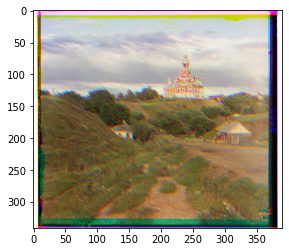

hw2_data/task3_colorizing/tobolsk.jpg
G to B:  [3, 2]
R to B:  [6, 3]
time:  0.2869699001312256


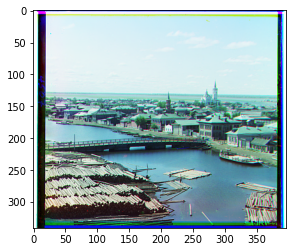

hw2_data/task3_colorizing/nativity.jpg
G to B:  [3, 1]
R to B:  [8, 0]
time:  0.2759401798248291


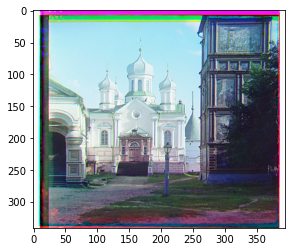

hw2_data/task3_colorizing/monastery.jpg
G to B:  [-3, 1]
R to B:  [11, 1]
time:  0.29440999031066895


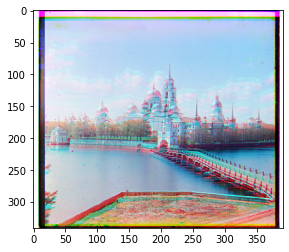

hw2_data/task3_colorizing/lady.tif
G to B:  [15, -9]
R to B:  [15, -8]
time:  32.73672676086426


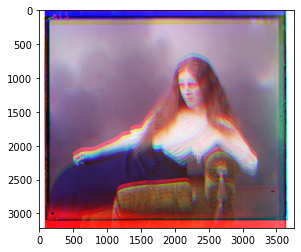

hw2_data/task3_colorizing/train.tif
G to B:  [7, -8]
R to B:  [15, -6]
time:  33.86442971229553


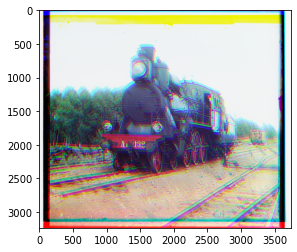

hw2_data/task3_colorizing/melons.tif
G to B:  [14, -11]
R to B:  [15, -15]
time:  34.573440074920654


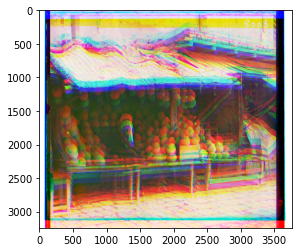

hw2_data/task3_colorizing/village.tif
G to B:  [15, -7]
R to B:  [15, 9]
time:  34.334882497787476


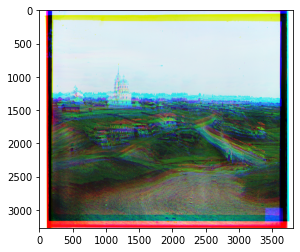

hw2_data/task3_colorizing/onion_church.tif
G to B:  [14, -3]
R to B:  [15, -3]
time:  34.328858613967896


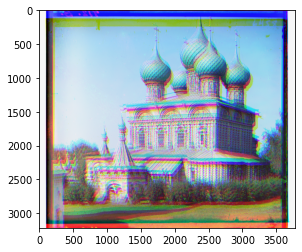

hw2_data/task3_colorizing/icon.tif
G to B:  [-7, -5]
R to B:  [15, -6]
time:  33.25173354148865


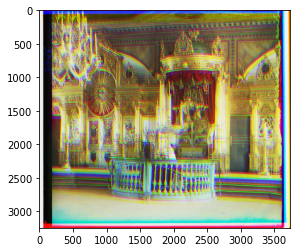

hw2_data/task3_colorizing/three_generations.tif
G to B:  [15, -1]
R to B:  [15, 4]
time:  33.545658588409424


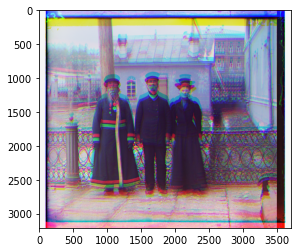

hw2_data/task3_colorizing/emir.tif
G to B:  [15, 14]
R to B:  [15, 15]
time:  32.84644150733948


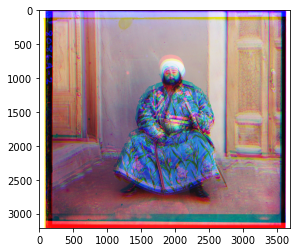

hw2_data/task3_colorizing/workshop.tif
G to B:  [15, 3]
R to B:  [15, -9]
time:  32.31899571418762


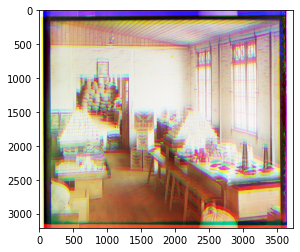

In [20]:
#simple align w/o norm
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #find displacement
    GtoB = align(img_G, img_B, [0,0], 15) 
    RtoB = align(img_R, img_B, [0,0], 15)

    #shift G and R channels to produce the result RGB image
    img_G = np.roll(img_G, GtoB[0], axis = 0)
    img_G = np.roll(img_G, GtoB[1], axis = 1)
    img_R = np.roll(img_R, RtoB[0], axis = 0)
    img_R = np.roll(img_R, RtoB[1], axis = 1)
    
    print("G to B: ", GtoB)
    print("R to B: ", RtoB)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD.jpg'))
    #cv2.imwrite(img_path, stacked)

hw2_data/task3_colorizing/cathedral.jpg
G to B:  [1, -1]
R to B:  [7, -1]
time:  0.46300745010375977


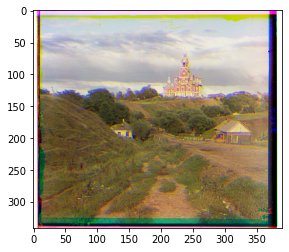

hw2_data/task3_colorizing/tobolsk.jpg
G to B:  [3, 2]
R to B:  [6, 3]
time:  0.5863571166992188


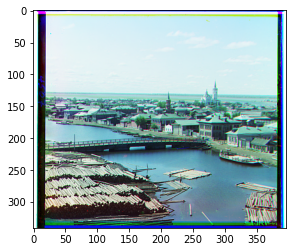

hw2_data/task3_colorizing/nativity.jpg
G to B:  [3, 1]
R to B:  [7, 1]
time:  0.4959068298339844


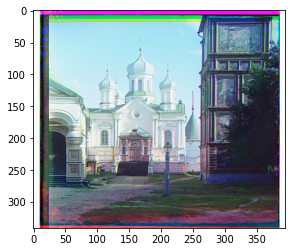

hw2_data/task3_colorizing/monastery.jpg
G to B:  [-6, 0]
R to B:  [9, 1]
time:  0.5399680137634277


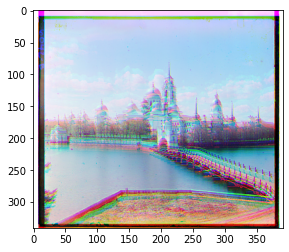

hw2_data/task3_colorizing/lady.tif
G to B:  [15, -8]
R to B:  [15, -15]
time:  216.81949138641357


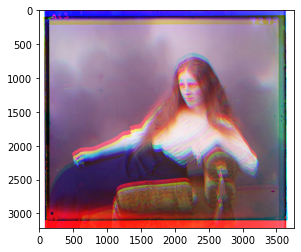

hw2_data/task3_colorizing/train.tif
G to B:  [0, -6]
R to B:  [15, -1]
time:  234.2790551185608


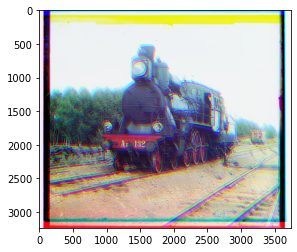

hw2_data/task3_colorizing/melons.tif
G to B:  [15, -4]
R to B:  [15, -8]
time:  303.589467048645


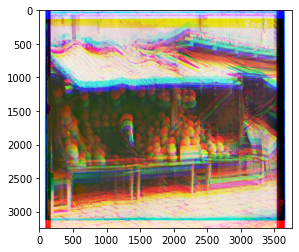

hw2_data/task3_colorizing/village.tif
G to B:  [15, -7]
R to B:  [15, -15]
time:  180.19089031219482


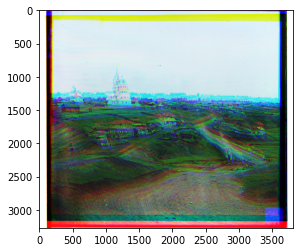

hw2_data/task3_colorizing/onion_church.tif
G to B:  [15, 0]
R to B:  [15, -1]
time:  175.0693838596344


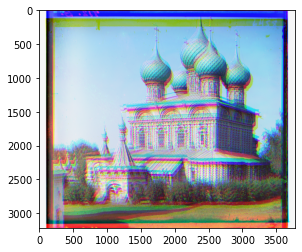

hw2_data/task3_colorizing/icon.tif
G to B:  [15, 15]
R to B:  [-15, -7]
time:  181.8402178287506


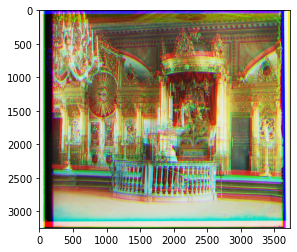

hw2_data/task3_colorizing/three_generations.tif
G to B:  [15, 1]
R to B:  [15, 3]
time:  174.70911478996277


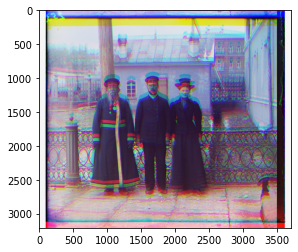

hw2_data/task3_colorizing/emir.tif
G to B:  [-3, 7]
R to B:  [-15, 15]
time:  178.98575973510742


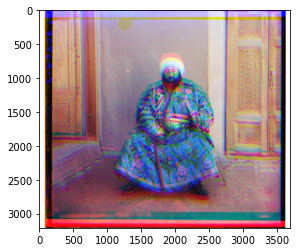

hw2_data/task3_colorizing/workshop.tif


KeyboardInterrupt: 

In [7]:
#simple align w/ norm
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]
    #print(img_B.shape)

    #normalize image
    img_G_norm = norm(img_G)
    img_B_norm = norm(img_B)
    img_R_norm = norm(img_R)
    
    #simple align
    GtoB = align(img_G_norm, img_B_norm, [0,0], 15) 
    RtoB = align(img_R_norm, img_B_norm, [0,0], 15)

    #shift G and R channels to produce the result RGB image
    img_G = np.roll(img_G, GtoB[0], axis = 0)
    img_G = np.roll(img_G, GtoB[1], axis = 1)
    img_R = np.roll(img_R, RtoB[0], axis = 0)
    img_R = np.roll(img_R, RtoB[1], axis = 1)
    
    print("G to B: ", GtoB)
    print("R to B: ", RtoB)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    #plt.subplot(1, 2, 2)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD.jpg'))
    #cv2.imwrite(img_path, stacked)

hw2_data/task3_colorizing/cathedral.jpg
(341, 390)
G to B:  [3, 0]
R to B:  [8, -1]
time:  0.2857370376586914


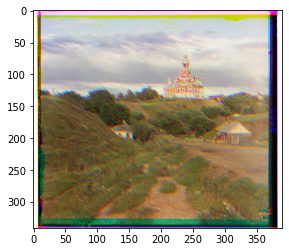

hw2_data/task3_colorizing/tobolsk.jpg
(341, 396)
G to B:  [3, 2]
R to B:  [6, 3]
time:  0.2799501419067383


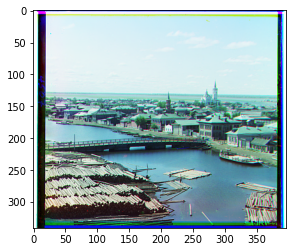

hw2_data/task3_colorizing/nativity.jpg
(341, 395)
G to B:  [3, 1]
R to B:  [8, 0]
time:  0.28843235969543457


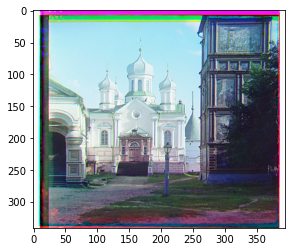

hw2_data/task3_colorizing/monastery.jpg
(341, 391)
G to B:  [-3, 1]
R to B:  [11, 1]
time:  0.2889525890350342


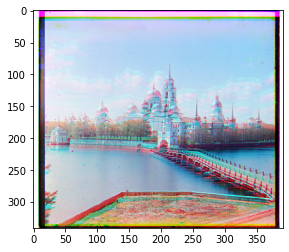

hw2_data/task3_colorizing/lady.tif
(3212, 3761)
(1606, 1881)
(803, 941)
(402, 471)
(201, 236)
G to B:  [-279, -279]
R to B:  [-279, -281]
time:  16.27531599998474


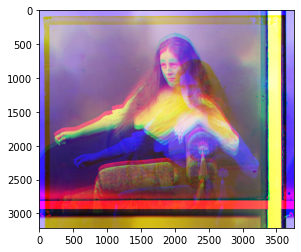

hw2_data/task3_colorizing/train.tif
(3238, 3741)
(1619, 1871)
(810, 936)
(405, 468)
(203, 234)
G to B:  [-279, -279]
R to B:  [-280, -280]
time:  15.19535517692566


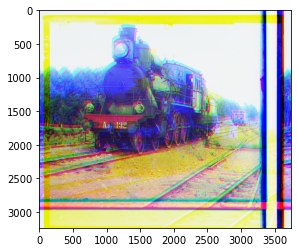

hw2_data/task3_colorizing/melons.tif
(3241, 3770)
(1621, 1885)
(811, 943)
(406, 472)
(203, 236)
G to B:  [-282, -279]
R to B:  [-282, -280]
time:  15.656893014907837


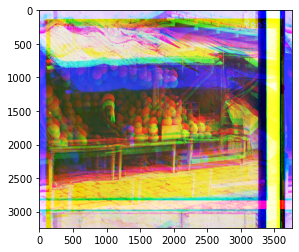

hw2_data/task3_colorizing/village.tif
(3270, 3819)
(1635, 1910)
(818, 955)
(409, 478)
(205, 239)
G to B:  [-279, -282]
R to B:  [-279, -279]
time:  16.35374164581299


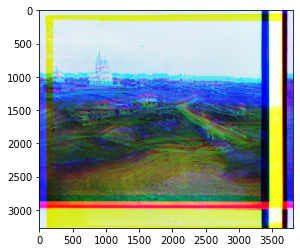

hw2_data/task3_colorizing/onion_church.tif
(3215, 3781)
(1608, 1891)
(804, 946)
(402, 473)
(201, 237)
G to B:  [-279, -285]
R to B:  [-285, -285]
time:  18.731820821762085


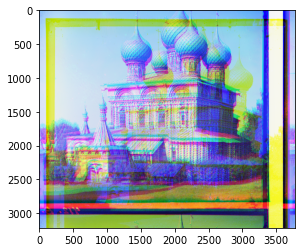

hw2_data/task3_colorizing/icon.tif
(3244, 3741)
(1622, 1871)
(811, 936)
(406, 468)
(203, 234)
G to B:  [-279, -282]
R to B:  [-284, -282]
time:  16.87854814529419


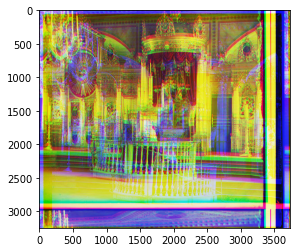

hw2_data/task3_colorizing/three_generations.tif
(3209, 3714)
(1605, 1857)
(803, 929)
(402, 465)
(201, 233)
G to B:  [-280, -279]
R to B:  [-282, -280]
time:  17.56304097175598


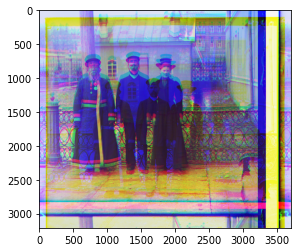

hw2_data/task3_colorizing/emir.tif
(3209, 3702)
(1605, 1851)
(803, 926)
(402, 463)
(201, 232)
G to B:  [-279, -279]
R to B:  [-279, -279]
time:  17.846940279006958


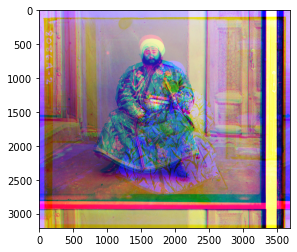

hw2_data/task3_colorizing/workshop.tif
(3209, 3741)
(1605, 1871)
(803, 936)
(402, 468)
(201, 234)
G to B:  [-283, -281]
R to B:  [-285, -285]
time:  16.031871557235718


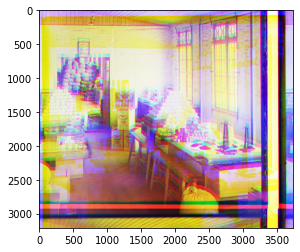

In [25]:
#pyramid align w/o norm
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #pyramid align
    [GtoB, RtoB] = pyramid_align(img_B, img_G, img_R)

    #shift G and R channels to produce the result RGB image
    img_G = np.roll(img_G, GtoB[0], axis = 0)
    img_G = np.roll(img_G, GtoB[1], axis = 1)
    img_R = np.roll(img_R, RtoB[0], axis = 0)
    img_R = np.roll(img_R, RtoB[1], axis = 1)
    
    print("G to B: ", GtoB)
    print("R to B: ", RtoB)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    #plt.subplot(1, 2, 2)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD_pyramid.jpg'))
    #cv2.imwrite(img_path, stacked)

hw2_data/task3_colorizing/cathedral.jpg
(341, 390)
G to B:  [1, -1]
R to B:  [7, -1]
time:  0.40303850173950195


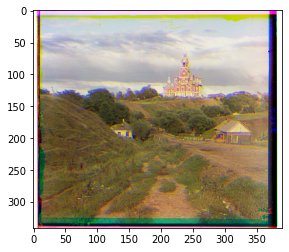

hw2_data/task3_colorizing/tobolsk.jpg
(341, 396)
G to B:  [3, 2]
R to B:  [6, 3]
time:  0.41883206367492676


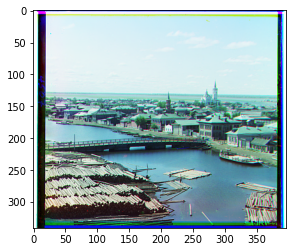

hw2_data/task3_colorizing/nativity.jpg
(341, 395)
G to B:  [3, 1]
R to B:  [7, 1]
time:  0.4039309024810791


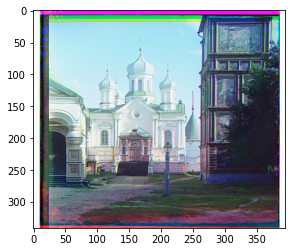

hw2_data/task3_colorizing/monastery.jpg
(341, 391)
G to B:  [-6, 0]
R to B:  [9, 1]
time:  0.398669958114624


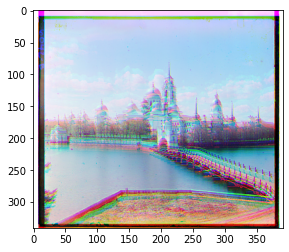

hw2_data/task3_colorizing/lady.tif
(3212, 3761)
(1606, 1881)
(803, 941)
(402, 471)
(201, 236)
G to B:  [57, -6]
R to B:  [123, -17]
time:  22.970067262649536


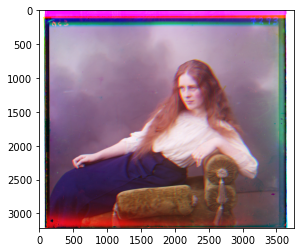

hw2_data/task3_colorizing/train.tif
(3238, 3741)
(1619, 1871)
(810, 936)
(405, 468)
(203, 234)
G to B:  [111, -7]
R to B:  [107, 1]
time:  21.59995722770691


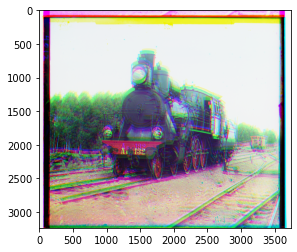

hw2_data/task3_colorizing/melons.tif
(3241, 3770)
(1621, 1885)
(811, 943)
(406, 472)
(203, 236)
G to B:  [83, 4]
R to B:  [177, 8]
time:  21.58648657798767


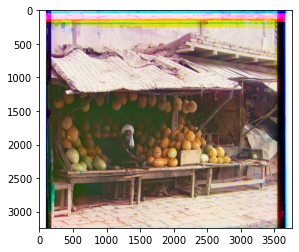

hw2_data/task3_colorizing/village.tif
(3270, 3819)
(1635, 1910)
(818, 955)
(409, 478)
(205, 239)
G to B:  [144, -7]
R to B:  [118, -15]
time:  23.356255769729614


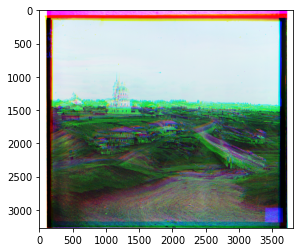

hw2_data/task3_colorizing/onion_church.tif
(3215, 3781)
(1608, 1891)
(804, 946)
(402, 473)
(201, 237)
G to B:  [52, 22]
R to B:  [108, 0]
time:  24.83497977256775


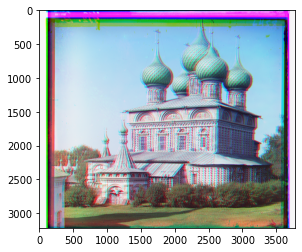

hw2_data/task3_colorizing/icon.tif
(3244, 3741)
(1622, 1871)
(811, 936)
(406, 468)
(203, 234)
G to B:  [42, 16]
R to B:  [89, 22]
time:  22.685935020446777


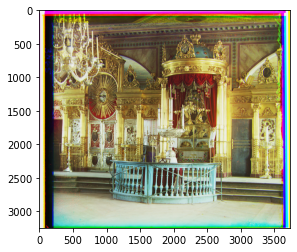

hw2_data/task3_colorizing/three_generations.tif
(3209, 3714)
(1605, 1857)
(803, 929)
(402, 465)
(201, 233)
G to B:  [52, 5]
R to B:  [108, 7]
time:  23.42525005340576


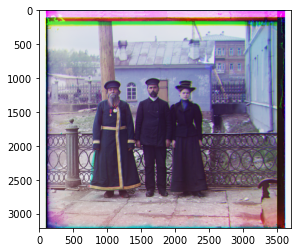

hw2_data/task3_colorizing/emir.tif
(3209, 3702)
(1605, 1851)
(803, 926)
(402, 463)
(201, 232)
G to B:  [-3, 7]
R to B:  [107, 17]
time:  23.6652512550354


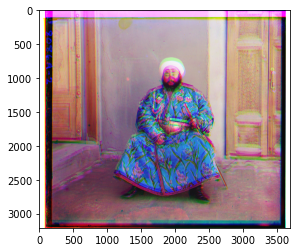

hw2_data/task3_colorizing/workshop.tif
(3209, 3741)
(1605, 1871)
(803, 936)
(402, 468)
(201, 234)
G to B:  [53, -5]
R to B:  [69, -16]
time:  22.700479984283447


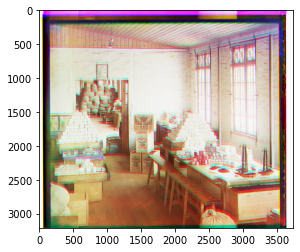

In [26]:
#pyramid align w/ norm
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #normalize image
    img_G_norm = norm(img_G)
    img_B_norm = norm(img_B)
    img_R_norm = norm(img_R)

    #pyramid align
    [GtoB, RtoB] = pyramid_align(img_B_norm, img_G_norm, img_R_norm)

    #shift G and R channels to produce the result RGB image
    img_G = np.roll(img_G, GtoB[0], axis = 0)
    img_G = np.roll(img_G, GtoB[1], axis = 1)
    img_R = np.roll(img_R, RtoB[0], axis = 0)
    img_R = np.roll(img_R, RtoB[1], axis = 1)
    
    print("G to B: ", GtoB)
    print("R to B: ", RtoB)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD_pyramid.jpg'))
    #cv2.imwrite(img_path, stacked)

hw2_data/task3_colorizing/cathedral.jpg
(341, 390)
B to G:  [-1, 1]
R to G:  [7, 0]
time:  0.7444169521331787


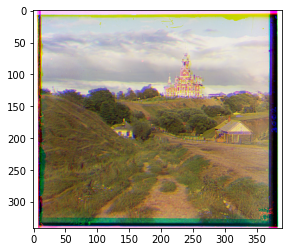

hw2_data/task3_colorizing/tobolsk.jpg
(341, 396)
B to G:  [-3, -2]
R to G:  [4, 1]
time:  0.8007552623748779


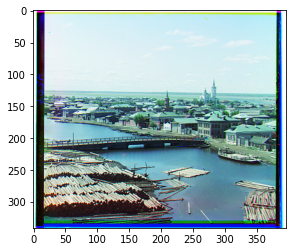

hw2_data/task3_colorizing/nativity.jpg
(341, 395)
B to G:  [-3, -1]
R to G:  [-2, 0]
time:  0.7006757259368896


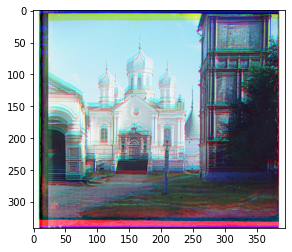

hw2_data/task3_colorizing/monastery.jpg
(341, 391)
B to G:  [6, 0]
R to G:  [6, 1]
time:  0.7127106189727783


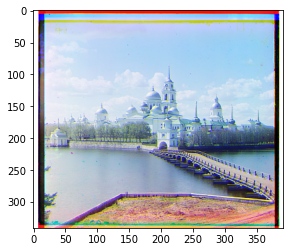

hw2_data/task3_colorizing/lady.tif
(3212, 3761)
(1606, 1881)
(803, 941)
(402, 471)
(201, 236)
B to G:  [-57, 6]
R to G:  [44, -10]
time:  34.40532732009888


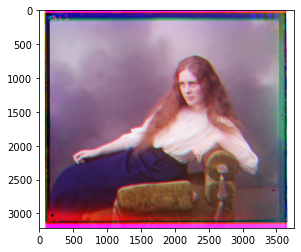

hw2_data/task3_colorizing/train.tif
(3238, 3741)
(1619, 1871)
(810, 936)
(405, 468)
(203, 234)
B to G:  [-111, 7]
R to G:  [111, 1]
time:  32.59180569648743


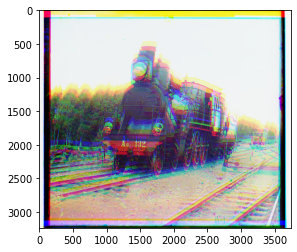

hw2_data/task3_colorizing/melons.tif
(3241, 3770)
(1621, 1885)
(811, 943)
(406, 472)
(203, 236)
B to G:  [-83, -4]
R to G:  [96, 3]
time:  26.72657012939453


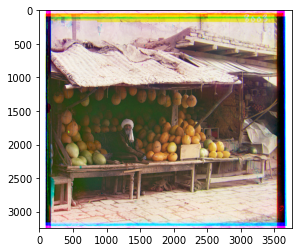

hw2_data/task3_colorizing/village.tif
(3270, 3819)
(1635, 1910)
(818, 955)
(409, 478)
(205, 239)
B to G:  [-144, 7]
R to G:  [103, -7]
time:  27.924309492111206


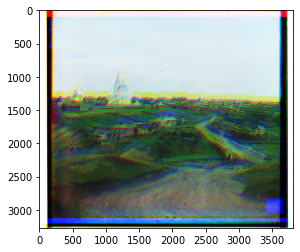

hw2_data/task3_colorizing/onion_church.tif
(3215, 3781)
(1608, 1891)
(804, 946)
(402, 473)
(201, 237)
B to G:  [-52, -22]
R to G:  [57, 10]
time:  27.35857391357422


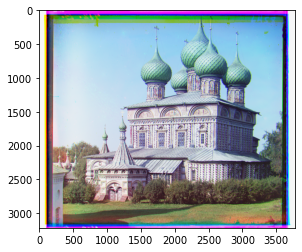

hw2_data/task3_colorizing/icon.tif
(3244, 3741)
(1622, 1871)
(811, 936)
(406, 468)
(203, 234)
B to G:  [-42, -16]
R to G:  [48, 5]
time:  25.323713541030884


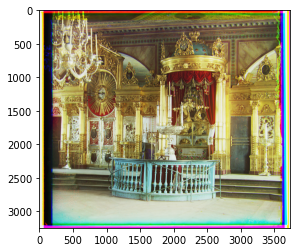

hw2_data/task3_colorizing/three_generations.tif
(3209, 3714)
(1605, 1857)
(803, 929)
(402, 465)
(201, 233)
B to G:  [-52, -5]
R to G:  [57, 0]
time:  26.046597957611084


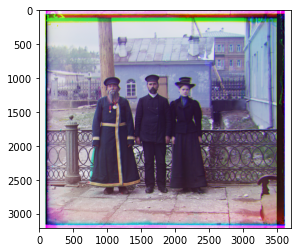

hw2_data/task3_colorizing/emir.tif
(3209, 3702)
(1605, 1851)
(803, 926)
(402, 463)
(201, 232)
B to G:  [3, -7]
R to G:  [116, 9]
time:  26.0990948677063


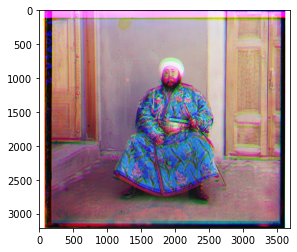

hw2_data/task3_colorizing/workshop.tif
(3209, 3741)
(1605, 1871)
(803, 936)
(402, 468)
(201, 234)
B to G:  [-53, 5]
R to G:  [51, -11]
time:  24.353808879852295


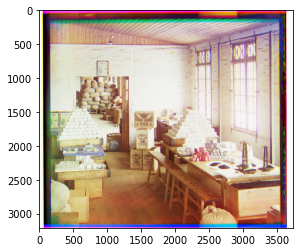

In [9]:
#pyramid align w/ norm use g-channel as base
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #normalize image
    img_G_norm = norm(img_G)
    img_B_norm = norm(img_B)
    img_R_norm = norm(img_R)

    #pyramid align
    #[GtoB, RtoB] = pyramid_align(img_B_norm, img_G_norm, img_R_norm)
    [BtoG, RtoG] = pyramid_align(img_G_norm, img_B_norm, img_R_norm)

    #shift G and R channels to produce the result RGB image
    img_B = np.roll(img_B, BtoG[0], axis = 0)
    img_B = np.roll(img_B, BtoG[1], axis = 1)
    img_R = np.roll(img_R, RtoG[0], axis = 0)
    img_R = np.roll(img_R, RtoG[1], axis = 1)
    
    print("B to G: ", BtoG)
    print("R to G: ", RtoG)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD_pyramid.jpg'))
    #cv2.imwrite(img_path, stacked)

hw2_data/task3_colorizing/cathedral.jpg
(341, 390)
B to R:  [-7, 1]
G to R:  [-7, 0]
time:  0.4259910583496094


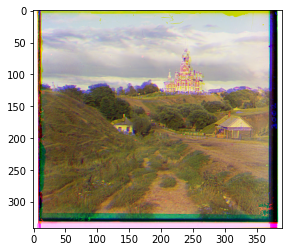

hw2_data/task3_colorizing/tobolsk.jpg
(341, 396)
B to R:  [-6, -3]
G to R:  [-4, -1]
time:  0.4429655075073242


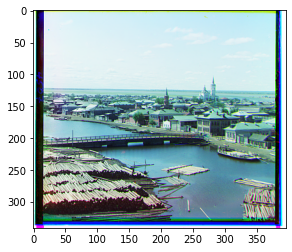

hw2_data/task3_colorizing/nativity.jpg
(341, 395)
B to R:  [-7, -1]
G to R:  [2, 0]
time:  0.43254709243774414


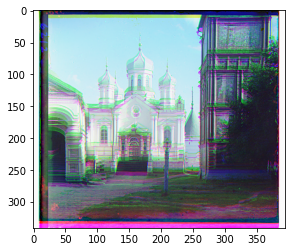

hw2_data/task3_colorizing/monastery.jpg
(341, 391)
B to R:  [-9, -1]
G to R:  [-6, -1]
time:  0.4353456497192383


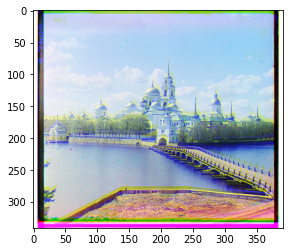

hw2_data/task3_colorizing/lady.tif
(3212, 3761)
(1606, 1881)
(803, 941)
(402, 471)
(201, 236)
B to R:  [-123, 17]
G to R:  [-44, 10]
time:  24.366572380065918


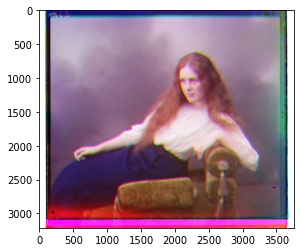

hw2_data/task3_colorizing/train.tif
(3238, 3741)
(1619, 1871)
(810, 936)
(405, 468)
(203, 234)
B to R:  [-107, -1]
G to R:  [-111, -1]
time:  23.854015350341797


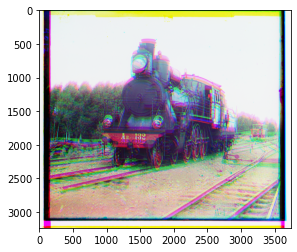

hw2_data/task3_colorizing/melons.tif
(3241, 3770)
(1621, 1885)
(811, 943)
(406, 472)
(203, 236)
B to R:  [-177, -8]
G to R:  [-96, -3]
time:  24.311076164245605


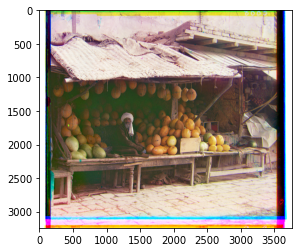

hw2_data/task3_colorizing/village.tif
(3270, 3819)
(1635, 1910)
(818, 955)
(409, 478)
(205, 239)
B to R:  [-118, 15]
G to R:  [-103, 7]
time:  24.25826096534729


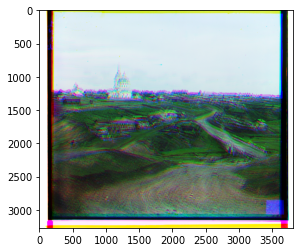

hw2_data/task3_colorizing/onion_church.tif
(3215, 3781)
(1608, 1891)
(804, 946)
(402, 473)
(201, 237)
B to R:  [-108, 0]
G to R:  [-57, -10]
time:  27.4012553691864


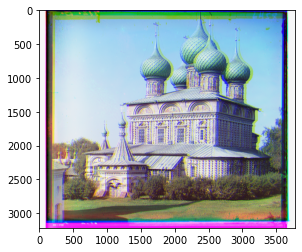

hw2_data/task3_colorizing/icon.tif
(3244, 3741)
(1622, 1871)
(811, 936)
(406, 468)
(203, 234)
B to R:  [-89, -22]
G to R:  [-48, -5]
time:  25.466375589370728


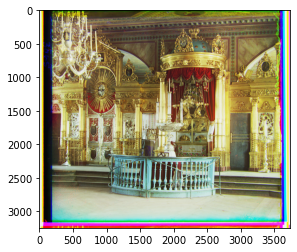

hw2_data/task3_colorizing/three_generations.tif
(3209, 3714)
(1605, 1857)
(803, 929)
(402, 465)
(201, 233)
B to R:  [-108, -7]
G to R:  [-57, 0]
time:  25.895023822784424


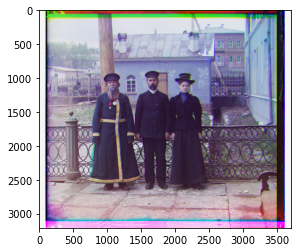

hw2_data/task3_colorizing/emir.tif
(3209, 3702)
(1605, 1851)
(803, 926)
(402, 463)
(201, 232)
B to R:  [-107, -17]
G to R:  [-116, -9]
time:  26.3259699344635


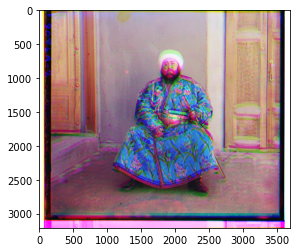

hw2_data/task3_colorizing/workshop.tif
(3209, 3741)
(1605, 1871)
(803, 936)
(402, 468)
(201, 234)
B to R:  [-69, 16]
G to R:  [-51, 11]
time:  23.744555950164795


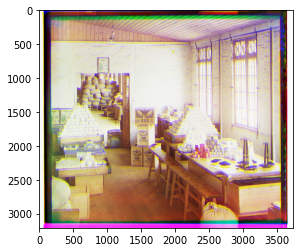

In [12]:
#pyramid align w/ norm use r-channel as base
for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #normalize image
    img_G_norm = norm(img_G)
    img_B_norm = norm(img_B)
    img_R_norm = norm(img_R)

    #pyramid align
    #[GtoB, RtoB] = pyramid_align(img_B_norm, img_G_norm, img_R_norm)
    [BtoR, GtoR] = pyramid_align(img_R_norm, img_B_norm, img_G_norm)

    #shift G and R channels to produce the result RGB image
    img_B = np.roll(img_B, BtoR[0], axis = 0)
    img_B = np.roll(img_B, BtoR[1], axis = 1)
    img_G = np.roll(img_G, GtoR[0], axis = 0)
    img_G = np.roll(img_G, GtoR[1], axis = 1)
    
    print("B to R: ", BtoR)
    print("G to R: ", GtoR)
    stacked = np.dstack([img_B, img_G, img_R])
    print('time: ', time.time() - start)
    plt.imshow(stacked[:,:,::-1])
    plt.show()
    #img_name = fname.split('/')[-1].split('.')[0]
    #img_path = join('hw2_data/task3_result/', (img_name + '_SSD_pyramid.jpg'))
    #cv2.imwrite(img_path, stacked)

In [11]:

for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    start = time.time()
    
    #Divide the original image into three images with same size
    d_len = img.shape[0]//3
    img_B = img[0:d_len, :]
    img_G = img[d_len:d_len*2, :]
    img_R = img[d_len*2:d_len*3, :]

    #normalize image
    #img_G_norm = norm(img_G)
    #img_B_norm = norm(img_B)
    #img_R_norm = norm(img_R)
    
    print('G: ', np.sum(img_G))
    print('B: ', np.sum(img_B))
    print('R: ', np.sum(img_R))

hw2_data/task3_colorizing/cathedral.jpg
G:  18317813
B:  15156935
R:  19821708
hw2_data/task3_colorizing/tobolsk.jpg
G:  22710438
B:  23471681
R:  19002566
hw2_data/task3_colorizing/nativity.jpg
G:  18345940
B:  19907623
R:  16771163
hw2_data/task3_colorizing/monastery.jpg
G:  23499329
B:  25231426
R:  22310685
hw2_data/task3_colorizing/lady.tif
G:  1333138586
B:  1584995728
R:  1747830107
hw2_data/task3_colorizing/train.tif
G:  2035588176
B:  1997898756
R:  2067207577
hw2_data/task3_colorizing/melons.tif
G:  1709043199
B:  1516588835
R:  1884715278
hw2_data/task3_colorizing/village.tif
G:  1808195000
B:  1712191801
R:  1618842053
hw2_data/task3_colorizing/onion_church.tif
G:  1919512810
B:  2057008445
R:  1779803436
hw2_data/task3_colorizing/icon.tif
G:  1644151303
B:  1238737827
R:  1740143227
hw2_data/task3_colorizing/three_generations.tif
G:  1541883339
B:  1757411347
R:  1642652582
hw2_data/task3_colorizing/emir.tif
G:  1480266374
B:  1603770147
R:  1782142667
hw2_data/task3_color